In [78]:
import pandas as pd 
import seaborn as sns 
import matplotlib.pyplot as plt
from matplotlib.pyplot import text
import numpy as np

In [196]:
fes_polar30 = pd.read_fwf('/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD-DONOT_RSYNC/fesxy30.grid', widths=[9,9,9], skiprows=9, header=None, names=['z','theta','fes'])
fes_polar30.dropna(how="all", inplace=True)
fes_polar40 = pd.read_fwf('/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD-DONOT_RSYNC/fesxy40.grid', widths=[9,9,9], skiprows=9, header=None, names=['z','theta','fes'])
fes_polar40.dropna(how="all", inplace=True)
fes_polar55 = pd.read_fwf('/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD-DONOT_RSYNC/fes55.grid', widths=[9,9,9], skiprows=9, header=None, names=['z','theta','fes'])
fes_polar55.dropna(how="all", inplace=True)
fes_polar70 = pd.read_fwf('/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD-DONOT_RSYNC/fesxy70.grid', widths=[9,9,9], skiprows=9, header=None, names=['z','theta','fes'])
fes_polar70.dropna(how="all", inplace=True)
fes_polar80 = pd.read_fwf('/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD-DONOT_RSYNC/fesxy80.grid', widths=[9,9,9], skiprows=9, header=None, names=['z','theta','fes'])
fes_polar80.dropna(how="all", inplace=True)
fes_polar90 = pd.read_fwf('/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD-DONOT_RSYNC/fesxy90.grid', widths=[9,9,9], skiprows=9, header=None, names=['z','theta','fes'])
fes_polar90.dropna(how="all", inplace=True)
fes_polar100 = pd.read_fwf('/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD-DONOT_RSYNC/fesxy100.grid', widths=[9,9,9], skiprows=9, header=None, names=['z','theta','fes'])
fes_polar100.dropna(how="all", inplace=True)
fes_polar101 = pd.read_fwf('/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD-DONOT_RSYNC/fesxy101.grid', widths=[9,9,9], skiprows=9, header=None, names=['z','theta','fes'])
fes_polar101.dropna(how="all", inplace=True)

In [215]:
# print(fes_polar55['fes'].max())
# print(fes_polar55['fes'].min())
# print(fes_polar70['fes'].max())
# print(fes_polar70['fes'].min())
# print(fes_polar80['fes'].max())
# print(fes_polar80['fes'].min())
# print(fes_polar90['fes'].max())
# print(fes_polar90['fes'].min())
# print(fes_polar100['fes'].max())
# print(fes_polar100['fes'].min())
# print(fes_polar101['fes'].max())
# print(fes_polar101['fes'].min())


In [191]:
hillsall100 = pd.read_fwf('/home/elaine/elaine_data/METAD_LQZ/UZH_WTMETAD-DONOT_RSYNC/HILLS.ALL100', header=None, 
                            names=["time", "s", "z", "theta", "sigma_s", "sigma_z", "sigma_theta", "heights", "biasfactor", "clock"],
                            comment='#', widths=[23,23,23,23,23,23,23,23,23,11])
hillsall90 = pd.read_fwf('/home/elaine/elaine_data/METAD_LQZ/UZH_WTMETAD-DONOT_RSYNC/HILLS.ALL90', header=None, 
                            names=["time", "s", "z", "theta", "sigma_s", "sigma_z", "sigma_theta", "heights", "biasfactor", "clock"],
                            comment='#', widths=[23,23,23,23,23,23,23,23,23,11])
hillsall80 = pd.read_fwf('/home/elaine/elaine_data/METAD_LQZ/UZH_WTMETAD-DONOT_RSYNC/HILLS.ALL80', header=None, 
                            names=["time", "s", "z", "theta", "sigma_s", "sigma_z", "sigma_theta", "heights", "biasfactor", "clock"],
                            comment='#', widths=[23,23,23,23,23,23,23,23,23,11])

In [193]:
# print(hillsall80['clock'].max())
# print(hillsall90['clock'].max())
# print(hillsall100['clock'].max())

In [203]:
def plot_polar_fes(df):
    """Plot polar contour plot using free energy grid data in pandas df with cols:z,theta,fes"""
    
    z_unique = np.sort(df.z.unique())
    theta_unique = np.sort(df.theta.unique())
    values = df.pivot_table(index='z', columns='theta', values='fes').T.values
    
    # Fix missing grid data at theta=pi by duplicating the last row of fes values
    theta_unique = np.append(theta_unique, [3.142])
    values = np.append(values, [values[-1]], axis=0)
    
#     print(theta_unique)
#     print(z_unique)
#     print(values)
#     print(len(values))
#     print(len(values[0]))
#     print(len(theta_unique))
#     print(len(z_unique))
#     print(values[-1])
    
    z, theta = np.meshgrid(z_unique, theta_unique)
    fig, ax = plt.subplots(subplot_kw=dict(projection='polar'), figsize=(10,10))
    
    # Adjust plot orientation and labels
    #ax.set_theta_zero_location("N")
    ax.set_theta_direction(-1)
    ax.set_theta_offset(1.12) #5.2)
    #ax.set_ylim(0, 20)
    ax.tick_params(labelbottom=False, grid_color="palegreen")
    ax.set_rticks([5, 10, 15, 20])
    ax.set_thetagrids([334, 64, 154, 244])
    ax.set_rlabel_position(270)
    
    # Plot contour, specifying limits for contour boundaries and colour palette
    cont = ax.contourf(theta, z, values, levels=np.arange(-127, 20, 5), cmap='Spectral')
    
    cb = fig.colorbar(cont)
    cb.set_label("Free Energy")
    
    plt.text(3.5, 16.8, "DIV", fontsize=24)
    plt.text(1.97, 15, "DIII", fontsize=24)
    plt.text(4.9, 15.8, "DI", fontsize=24)
    plt.text(0.4, 15, "DII", fontsize=24)
    
    return fig, ax, cont

# 2D CONTOUR: FREE ENERGY SURFACES (xy plane)

* Checking convergence of fes over the last ~20ns of simulations

## FES:most recent 

with walker2@90 (running) , walker3 failed@60, walker4@30 (running w/ sander, walker1@60 (walkers0,5,6,7,8 complete@100ns)

* pore minima has gotten significantly deeper (126 vs 116 previously)

(<Figure size 720x720 with 2 Axes>,
 <PolarAxesSubplot:>,
 <matplotlib.contour.QuadContourSet at 0x7ff7a8c0a370>)

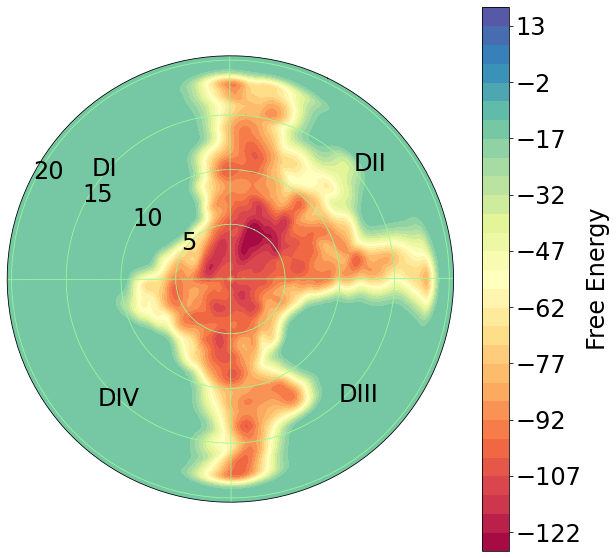

In [204]:
plot_polar_fes(fes_polar101)

## FES100 
* after walkers5,6,7,8 completed 100ns
* appearance of new minimum protruding into DIII extending from the middle of DIII-IV fenestration

(<Figure size 720x720 with 2 Axes>,
 <PolarAxesSubplot:>,
 <matplotlib.contour.QuadContourSet at 0x7ff7d8107910>)

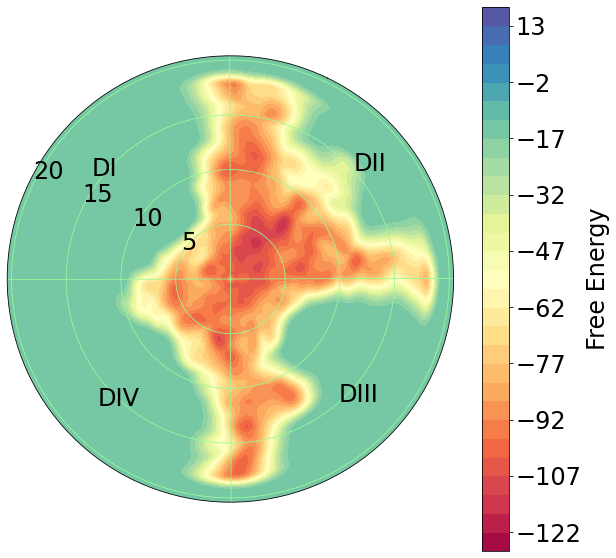

In [205]:
plot_polar_fes(fes_polar100)

## FES90

DIII-IV well sampled, up to the wall restraint boundary

(<Figure size 720x720 with 2 Axes>,
 <PolarAxesSubplot:>,
 <matplotlib.contour.QuadContourSet at 0x7ff7a24d0d90>)

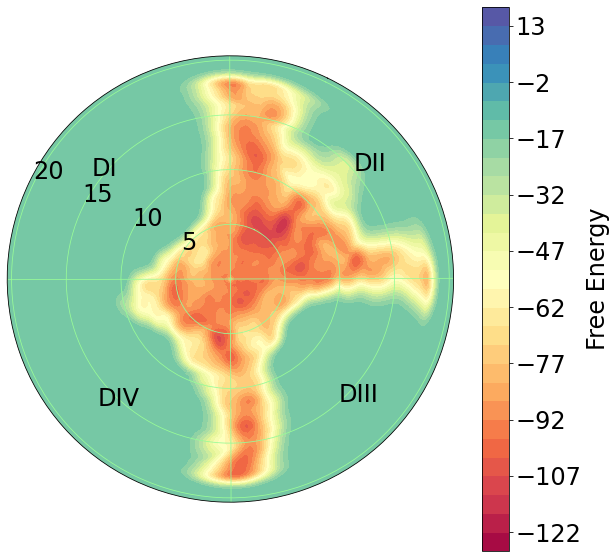

In [206]:
plot_polar_fes(fes_polar90)

## FES80


(<Figure size 720x720 with 2 Axes>,
 <PolarAxesSubplot:>,
 <matplotlib.contour.QuadContourSet at 0x7ff7d0c78310>)

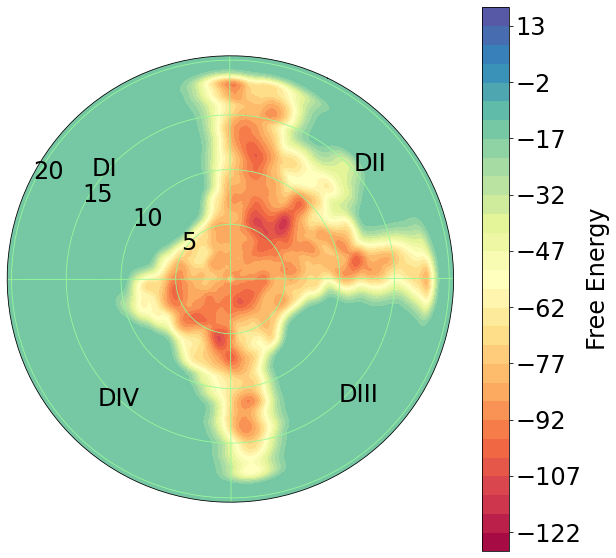

In [207]:
plot_polar_fes(fes_polar80)

# PLOTTING HILL HEIGHTS

## Timeline of Hills Deposited by All Walkers

* Plot of Hill heights vs Wallclock time (of all walkers combined)

In [208]:
dfhills = pd.read_fwf('/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD-DONOT_RSYNC/HILLS_LATEST/HILLS.ALL', header=None, 
                            names=["time", "s", "z", "theta", "sigma_s", "sigma_z", "sigma_theta", "heights", "biasfactor", "clock"],
                            comment='#', widths=[23,23,23,23,23,23,23,23,23,11])

hills0 = pd.read_fwf('/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD-DONOT_RSYNC/HILLS_LATEST/HILLS.0', header=None, 
                            names=["time", "s", "z", "theta", "sigma_s", "sigma_z", "sigma_theta", "heights", "biasfactor", "clock"],
                            comment='#', widths=[23,23,23,23,23,23,23,23,23,11])

hills5 = pd.read_fwf('/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD-DONOT_RSYNC/HILLS_LATEST/HILLS.5', header=None, 
                            names=["time", "s", "z", "theta", "sigma_s", "sigma_z", "sigma_theta", "heights", "biasfactor", "clock"],
                            comment='#', widths=[23,23,23,23,23,23,23,23,23,11])
hills6 = pd.read_fwf('/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD-DONOT_RSYNC/HILLS_LATEST/HILLS.6', header=None, 
                            names=["time", "s", "z", "theta", "sigma_s", "sigma_z", "sigma_theta", "heights", "biasfactor", "clock"],
                            comment='#', widths=[23,23,23,23,23,23,23,23,23,11])
hills7 = pd.read_fwf('/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD-DONOT_RSYNC/HILLS_LATEST/HILLS.7', header=None, 
                            names=["time", "s", "z", "theta", "sigma_s", "sigma_z", "sigma_theta", "heights", "biasfactor", "clock"],
                            comment='#', widths=[23,23,23,23,23,23,23,23,23,11])
hills8 = pd.read_fwf('/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD-DONOT_RSYNC/HILLS_LATEST/HILLS.8', header=None, 
                            names=["time", "s", "z", "theta", "sigma_s", "sigma_z", "sigma_theta", "heights", "biasfactor", "clock"],
                            comment='#', widths=[23,23,23,23,23,23,23,23,23,11])

hills1 = pd.read_fwf('/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD-DONOT_RSYNC/HILLS_LATEST/HILLS.1', header=None, 
                            names=["time", "s", "z", "theta", "sigma_s", "sigma_z", "sigma_theta", "heights", "biasfactor", "clock"],
                            comment='#', widths=[23,23,23,23,23,23,23,23,23,11])
hills2 = pd.read_fwf('/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD-DONOT_RSYNC/HILLS_LATEST/HILLS.2', header=None, 
                            names=["time", "s", "z", "theta", "sigma_s", "sigma_z", "sigma_theta", "heights", "biasfactor", "clock"],
                            comment='#', widths=[23,23,23,23,23,23,23,23,23,11])
hills3 = pd.read_fwf('/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD-DONOT_RSYNC/HILLS_LATEST/HILLS.3', header=None, 
                            names=["time", "s", "z", "theta", "sigma_s", "sigma_z", "sigma_theta", "heights", "biasfactor", "clock"],
                            comment='#', widths=[23,23,23,23,23,23,23,23,23,11])
hills4 = pd.read_fwf('/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD-DONOT_RSYNC/HILLS_LATEST/HILLS.4', header=None, 
                            names=["time", "s", "z", "theta", "sigma_s", "sigma_z", "sigma_theta", "heights", "biasfactor", "clock"],
                            comment='#', widths=[23,23,23,23,23,23,23,23,23,11])


In [209]:
hills0['walker'] = 0
hills5['walker'] = 5
hills6['walker'] = 6
hills7['walker'] = 7
hills8['walker'] = 8
hills1['walker'] = 1
hills2['walker'] = 2
hills3['walker'] = 3
hills4['walker'] = 4

hills0.drop(columns='time')
hills0['time'] = np.arange(2, len(hills0)*2+2, 2)
hills1.drop(columns='time')
hills1['time'] = np.arange(2, len(hills1)*2+2, 2)
hills2.drop(columns='time')
hills2['time'] = np.arange(2, len(hills2)*2+2, 2)
hills3.drop(columns='time')
hills3['time'] = np.arange(2, len(hills3)*2+2, 2)
hills4.drop(columns='time')
hills4['time'] = np.arange(2, len(hills4)*2+2, 2)

hills5_8_0 = pd.concat([hills5, hills6, hills7, hills8, hills0])
hills1_4 = pd.concat([hills4, hills3, hills2, hills1])

In [58]:
def sort_by_clock(df):
    df_new = df.sort_values("clock")
    df_new = df.reset_index()
    return df_new

In [70]:

# fig, ax = plt.subplots(figsize=(40, 10))
# sns.scatterplot(data=sort_by_clock(dfhills), x='index', y='heights', marker='.')

In [69]:
# fig, ax = plt.subplots(figsize=(40, 10))
# sns.scatterplot(data=sort_by_clock(dfhills), x='time', y='heights', marker='.')

Text(1616804314, 1.2, 'FES100 Written')

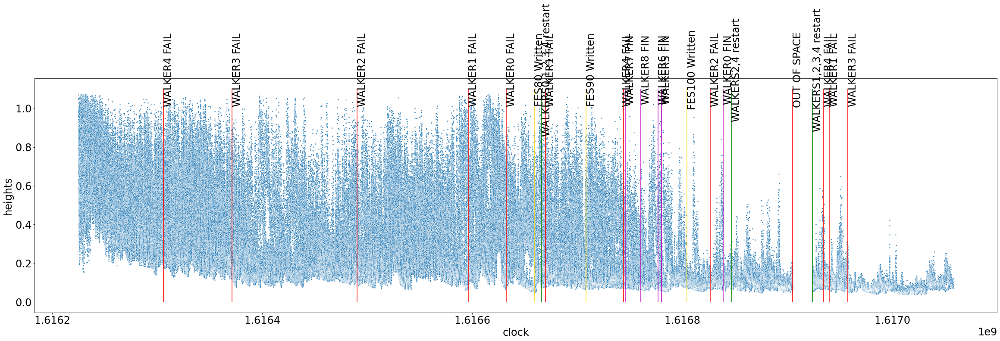

In [210]:
fig, ax = plt.subplots(figsize=(40, 10))
sns.scatterplot(data=dfhills, x='clock', y='heights', marker='.')

failed = [1616305813, 1616371126, 1616490040, 1616595928, 1616632325]
plt.vlines(x=[failed], ymin=0, ymax=1.1, color = 'r')
for i, x in enumerate(failed):
    text(x, 1.2, "WALKER%d FAIL" % (4-i), rotation=90, verticalalignment='center')
    
plt.vlines(x=[1616666000], ymin=0, ymax=1.1, color = 'g')
text(1616666000, 1.2, "WALKERS0,1,2,3,4 restart", rotation=90, verticalalignment='center')

fin = [1616780168, 1616776760, 1616745544, 1616760350, 1616838880]
plt.vlines(x=fin, ymin=0, ymax=1.1, color = 'm')
text(1616838880, 1.2, "WALKER0 FIN", rotation=90, verticalalignment='center')
text(1616780168, 1.2, "WALKER5 FIN", rotation=90, verticalalignment='center')
text(1616776760, 1.2, "WALKER6 FIN", rotation=90, verticalalignment='center')
text(1616745544, 1.2, "WALKER7 FIN", rotation=90, verticalalignment='center')
text(1616760350, 1.2, "WALKER8 FIN", rotation=90, verticalalignment='center')

plt.vlines(x=[1616669502], ymin=0, ymax=1.1, color = 'r')
text(1616669502, 1.2, "WALKER1 FAIL", rotation=90, verticalalignment='center')

plt.vlines(x=[1616826506], ymin=0, ymax=1.1, color = 'r')
text(1616826506, 1.2, "WALKER2 FAIL", rotation=90, verticalalignment='center')

plt.vlines(x=[1616744079], ymin=0, ymax=1.1, color = 'r')
text(1616742879, 1.2, "WALKER4 FAIL", rotation=90, verticalalignment='center')

plt.vlines(x=[1616846512], ymin=0, ymax=1.1, color = 'g')
text(1616846512, 1.2, "WALKERS2,4 restart", rotation=90, verticalalignment='center')

plt.vlines(x=[1616904809], ymin=0, ymax=1.1, color = 'r')
text(1616904809, 1.2, "OUT OF SPACE", rotation=90, verticalalignment='center')

plt.vlines(x=[1616923834], ymin=0, ymax=1.1, color = 'g')
text(1616923834, 1.2, "WALKERS1,2,3,4 restart", rotation=90, verticalalignment='center')

plt.vlines(x=[1616939739], ymin=0, ymax=1.1, color = 'r')
text(1616939739, 1.2, "WALKER1 FAIL", rotation=90, verticalalignment='center')
plt.vlines(x=[1616934349], ymin=0, ymax=1.1, color = 'r')
text(1616934349, 1.2, "WALKER4 FAIL", rotation=90, verticalalignment='center')
plt.vlines(x=[1616957510], ymin=0, ymax=1.1, color = 'r')
text(1616957510, 1.2, "WALKER3 FAIL", rotation=90, verticalalignment='center')

plt.vlines(x=[1616658930], ymin=0, ymax=1.1, color = 'gold')
text(1616658930, 1.2, "FES80 Written", rotation=90, verticalalignment='center')
plt.vlines(x=[1616708100], ymin=0, ymax=1.1, color = 'gold')
text(1616708100, 1.2, "FES90 Written", rotation=90, verticalalignment='center')
plt.vlines(x=[1616804314], ymin=0, ymax=1.1, color = 'gold')
text(1616804314, 1.2, "FES100 Written", rotation=90, verticalalignment='center')


## Checking hill heights of walkers that completed 100ns: #7,8,6,5,0 (in order of which finished first)

* Walker7 is staying exclusively within the pore cavity for the last 20ns, which appears to be in a well-sampled area, whereas Walker8 is exploring DIII-IV and is still depositing fairly large hills. Therefore, could keep running past 100ns until walker8 hill heights look like walker7...

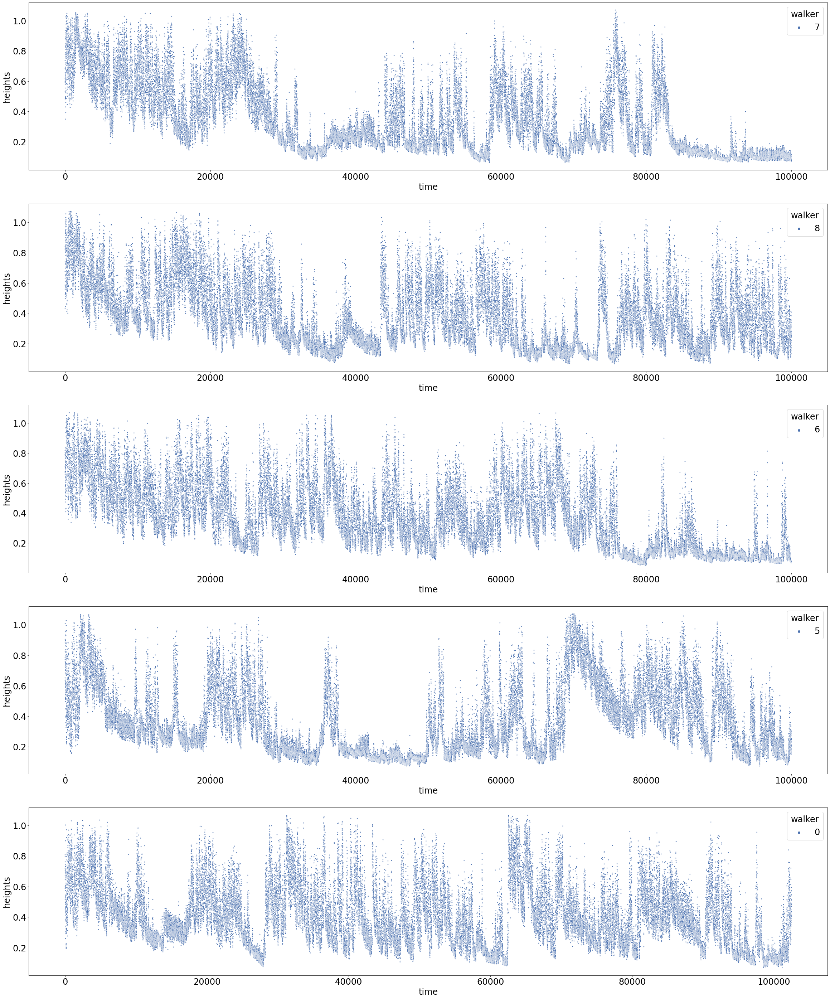

In [161]:
fig, axes = plt.subplots(5, 1, figsize=(40, 50))

sns.scatterplot(data=hills5, x='time', y='heights', hue='walker', marker='.', palette='deep', ax=axes[3])
sns.scatterplot(data=hills6, x='time', y='heights', hue='walker', marker='.', palette='deep', ax=axes[2])
sns.scatterplot(data=hills7, x='time', y='heights', hue='walker', marker='.', palette='deep', ax=axes[0])
sns.scatterplot(data=hills8, x='time', y='heights', hue='walker', marker='.', palette='deep', ax=axes[1])
sns.scatterplot(data=hills0, x='time', y='heights', hue='walker', marker='.', palette='deep', ax=axes[4])
plt.rcParams['font.size'] = '24'

## Checking hill heights of incomplete walkers: #1,2,3,4 that failed at various timepoints

* Given the reduced heights of these problematic walkers, perhaps not worth trying to restart them. 

<AxesSubplot:xlabel='time', ylabel='heights'>

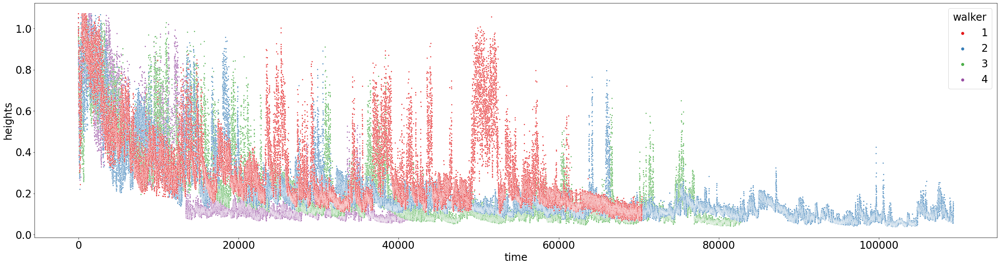

In [211]:
fig, axes = plt.subplots(figsize=(40, 10))
plt.rcParams['font.size'] = '24'
sns.scatterplot(data=hills1_4, x='time', y='heights', hue='walker', marker='.', palette='Set1')

In [153]:
# w4 failed 1616305813
# w4 restart 1616665025
# w3 failed 1616371126
# w3 restart 1616665528
# w2 failed 1616490040
# w2 restart 1616666749
# w1 failed 1616595928
# w1 restart 1616666803
# w0 failed 1616632325
# w0 restart 1616667365
# w5 fin 1616780168
# w6 fin 1616776760
# w7 fin 1616745544
# w8 fin 1616760350
# w0 fin 1616838880

# SAMPLING OF PORE SPACE: X Y Z

z and theta variables transformed to xy coordinates using:
   * x = z * sin(theta) + pi/4
   * y = z * cos(theta) + pi/4
   
in order to check sampling into each fenestration.


Harmonic restraints placed on:
* s @ 12 and -12 A (upper and lower boundary along pore axis)
* z @ radius of 18 A (circular boundary along xy plane)

In [145]:
# dfhills_sort = sort_by_clock(dfhills)

# x = dfhills_sort['z'] * np.sin(dfhills['theta'] + (np.pi/4))
# y = dfhills_sort['z'] * np.cos(dfhills['theta'] + (np.pi/4))
# i = np.arange(0, len(sort_by_clock(dfhills)))

# fig, axes = plt.subplots(3, 1, figsize=(20,60), sharey=True)
# sns.scatterplot(x=dfhills_sort['clock'], y=x, marker='.', ax=axes[0])
# sns.scatterplot(x=dfhills_sort['clock'], y=y, marker='.', ax=axes[1])
# sns.scatterplot(x=dfhills_sort['clock'], y=dfhills['s'], marker='.', ax=axes[2])

## Complete (100ns) walkers: 0,5,6,7,8

* extensive sampling into fenestration DI-II by walker6
* A single walker tends to explore into each fenestration, hit the wall restraints, and then return to the pore ( Walker0->DII-III; Walker6->DI-II; Walker8->DIII-IV ). Subsequent walkers to enter each fenestration tend to not traverse as far. 
* Intracellular pore opening well-sampled by Walkers0&5

Text(50000, -17, 'Pore Gate')

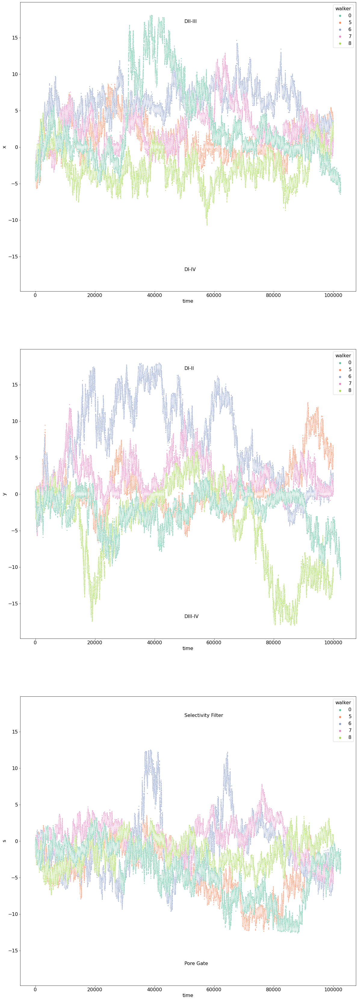

In [167]:
hills5_8_0['x'] = hills5_8_0['z'] * np.sin(hills5_8_0['theta'] + (np.pi/4))
hills5_8_0['y'] = hills5_8_0['z'] * np.cos(hills5_8_0['theta'] + (np.pi/4))

fig, axes = plt.subplots(3, 1, figsize=(20,60), sharey=True)
sns.scatterplot(data=hills5_8_0, x='time', y='x', marker='.', ax=axes[0], hue='walker', palette='Set2')
sns.scatterplot(data=hills5_8_0, x='time', y='y', marker='.', ax=axes[1], hue='walker', palette='Set2')
sns.scatterplot(data=hills5_8_0, x='time', y='s', marker='.', ax=axes[2], hue='walker', palette='Set2')

plt.rcParams['font.size'] = '16'
axes[0].text(50000, 17, "DII-III")
axes[0].text(50000, -17, "DI-IV")
axes[1].text(50000, 17, "DI-II")
axes[1].text(50000, -17, "DIII-IV")
axes[2].text(50000, 17, "Selectivity Filter")
axes[2].text(50000, -17, "Pore Gate")

## Incomplete walkers: 1,2,3,4

### FAILED WALKERS:
| Walker | Inital Fail | Restarts | Notes |
|--------|-------------| ---------|-----|
| 0      | 72ns | Restarted from 70 | COMPLETED to 100ns |
| 1      | 65ns | Restarted from 60 | Multiple restarts (tried CPU instead of GPU) - did not get past 1ns |
| 2      | 43ns | Restarted from 40; 60; 70 | ..still running |
| 3      | 27ns | Restarted from 20; 60; 60 | last fail at 65
| 4      | 13ns | Restarted from 10; 20; 30 | still running v slowly (sander)

* Lagging walkers have not sampled as far into each fenestration
* Walkers1-4 seem highly mobile and combined with the fact that heights of hill depositions is significantly reduced, suggests that the pore and fenestration space has been adequately sampled and that the energy surface has been sufficiently flattened. 
* Movement of Walker1 is confined within the pore cavity after 60ns as it repeatedly failed without writing a new restart file and was restarted using the old rst7 (hills were kept as they contributed to the metad potential of other walkers)

Text(55000, -9.5, 'Pore Gate')

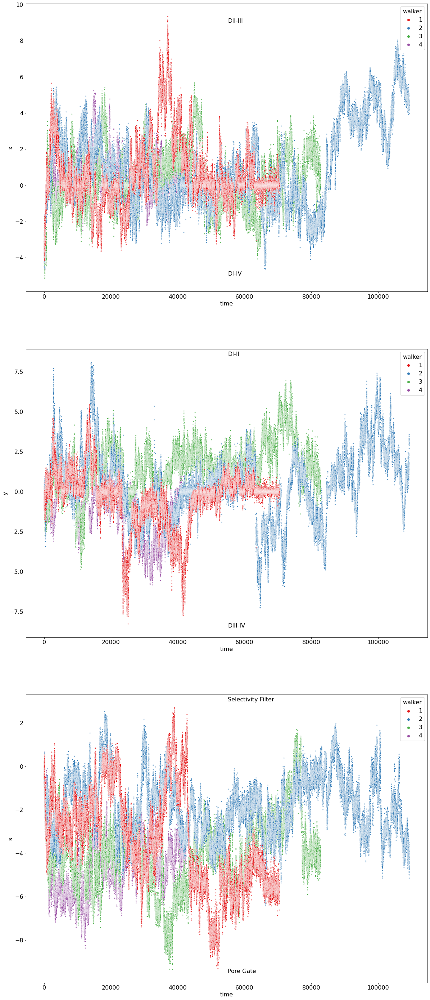

In [214]:
hills1_4['x'] = hills1_4['z'] * np.sin(hills1_4['theta'] + (np.pi/4))
hills1_4['y'] = hills1_4['z'] * np.cos(hills1_4['theta'] + (np.pi/4))

fig, axes = plt.subplots(3, 1, figsize=(20,50))
sns.scatterplot(data=hills1_4, x='time', y='x', marker='.', ax=axes[0], hue='walker', palette='Set1')
sns.scatterplot(data=hills1_4, x='time', y='y', marker='.', ax=axes[1], hue='walker', palette='Set1')
sns.scatterplot(data=hills1_4, x='time', y='s', marker='.', ax=axes[2], hue='walker', palette='Set1')

plt.rcParams['font.size'] = '16'
axes[0].text(55000, 9, "DII-III")
axes[0].text(55000, -5, "DI-IV")
axes[1].text(55000, 8.5, "DI-II")
axes[1].text(55000, -8.5, "DIII-IV")
axes[2].text(55000, 3, "Selectivity Filter")
axes[2].text(55000, -9.5, "Pore Gate")